In [1]:
freq = 15

In [2]:
paciente='paciente3'

In [3]:
import codigo
from codigo import utils
from codigo import model_LSTM
from codigo import model_utils
from cg_ega.cg_ega import CG_EGA

In [4]:
import pandas as pd
import numpy as np
pd.set_option('mode.chained_assignment',None)
import matplotlib.pyplot as plt
import seaborn as sns
import math

%matplotlib inline

In [5]:
import tensorflow as tf
from tensorflow import keras

In [6]:
with open('dataset/generado/'+paciente+'/array_Xtest.npy', 'rb') as f:
    array_Xtest = np.load(f)

In [7]:
len(array_Xtest)

3586

In [8]:
with open('dataset/generado/'+paciente+'/array_Ytest.npy', 'rb') as f:
    array_Ytest = np.load(f)

In [9]:
len(array_Ytest)

3586

# Pruebas Vanilla LSTM con dropout

In [10]:
model = keras.models.load_model('modelos/'+paciente+'/vanilla_dropout.h5')

In [11]:
from pickle import load
scalerGlucosa = load(open('dataset/generado/scalerGlucosa.scaler', 'rb'))

# Predicción de todo el conjunto de pruebas generales

In [12]:
len(array_Ytest)

3586

113/113 [==============================] - 1s 5ms/step


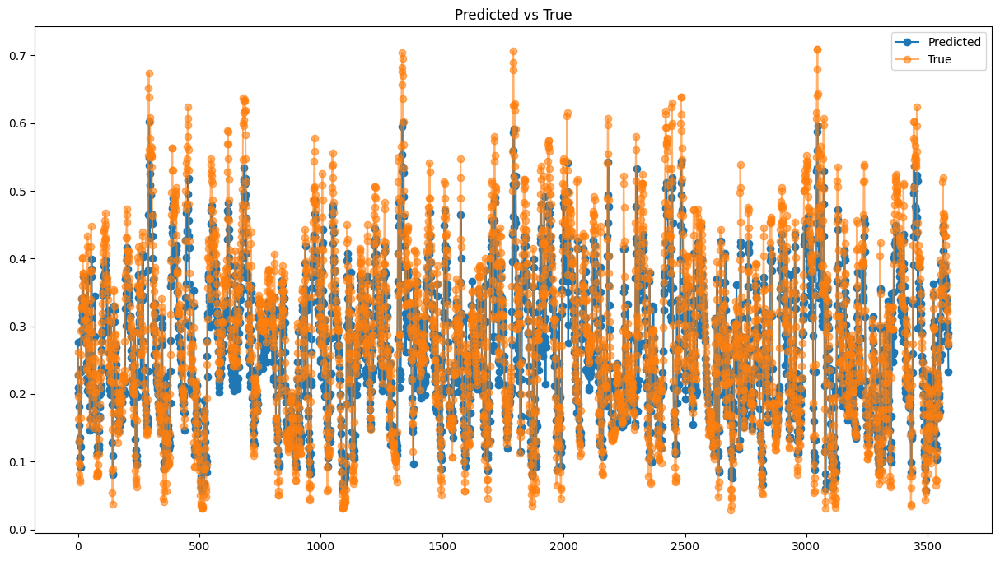

In [13]:
yhat = model.predict(array_Xtest)
model_utils.plotPredicted(yhat,array_Ytest)

In [14]:
model_utils.forecast_accuracy(yhat,array_Ytest)

{'mae': 0.04389553428547976,
 'mse': 0.057427285408514474,
 'rmse': 0.0032978931093909794}

In [15]:
yhat_scaled=scalerGlucosa.inverse_transform(yhat)
yhat_df = pd.DataFrame(yhat_scaled, columns=['Glucose level'])
yhat_df

,Glucose level
0,167.153549
1,145.020233
2,136.161499
3,132.589844
4,123.476906
...,...
3581,172.909210
3582,169.933060
3583,173.066101
3584,165.065720


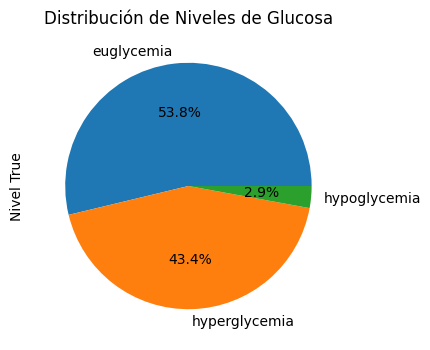

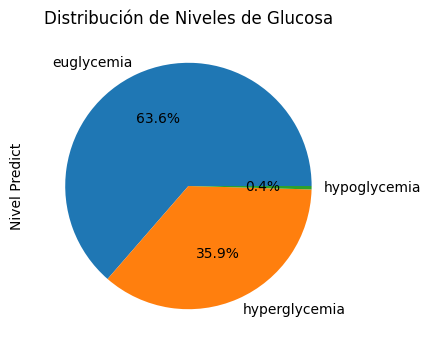

,Glucose level True,Nivel True,Glucose level Predict,Nivel Predict
0,160.454545,euglycemia,167.153549,euglycemia
1,145.363636,euglycemia,145.020233,euglycemia
2,130.272727,euglycemia,136.161499,euglycemia
3,115.181818,euglycemia,132.589844,euglycemia
4,100.090909,euglycemia,123.476906,euglycemia


In [16]:
Y_scaled=scalerGlucosa.inverse_transform(array_Ytest)
yhat_scaled=scalerGlucosa.inverse_transform(yhat)

df_glucose = pd.DataFrame(Y_scaled, columns=['Glucose level True']) 
df_glucose['Nivel True'] = df_glucose['Glucose level True'].apply(utils.label_LevelBG) 
df_glucose['Nivel True'].value_counts().plot.pie(title='Distribución de Niveles de Glucosa',y='level_label',legend=False,autopct='%1.1f%%',figsize=(10, 4))
plt.show()

df_glucose['Glucose level Predict']=yhat_scaled
df_glucose['Nivel Predict'] = df_glucose['Glucose level Predict'].apply(utils.label_LevelBG) 

df_glucose['Nivel Predict'].value_counts().plot.pie(title='Distribución de Niveles de Glucosa',y='level_label',legend=False,autopct='%1.1f%%',figsize=(10, 4))
plt.show()

df_glucose.head()


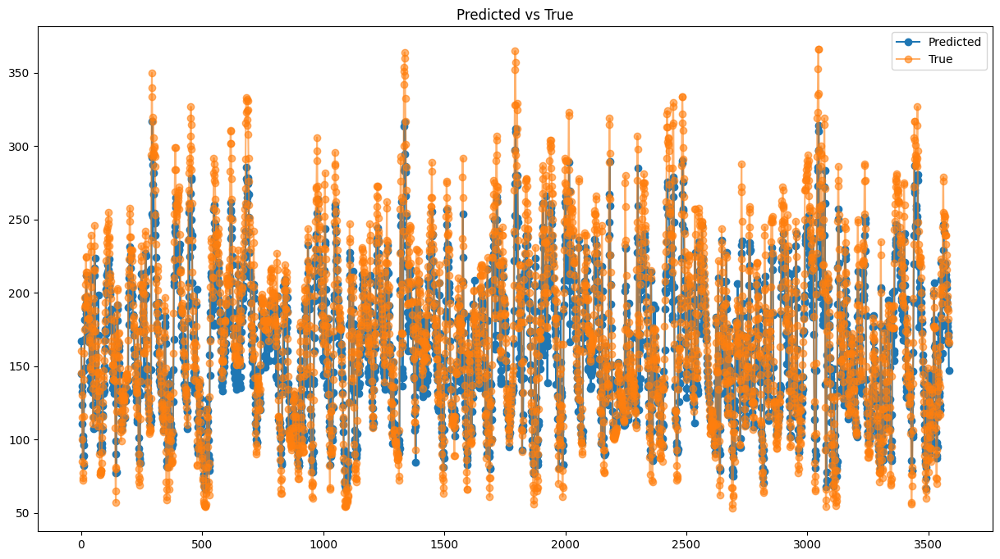

{'mae': 20.191944586990022,
 'mse': 26.416550496765804,
 'rmse': 697.8341401481777}

In [17]:
model_utils.plotPredicted(yhat_scaled,Y_scaled)
model_utils.forecast_accuracy(yhat_scaled,Y_scaled)

In [18]:
array_Ytest_scaled=scalerGlucosa.inverse_transform(array_Ytest)
array_Ytest_df = pd.DataFrame(array_Ytest_scaled, columns=['Glucose level'])
array_Ytest_df

,Glucose level
0,160.454545
1,145.363636
2,130.272727
3,115.181818
4,100.090909
...,...
3581,188.000000
3582,182.000000
3583,171.000000
3584,167.000000


In [19]:
dfPlot=pd.DataFrame()
dfPlot['y_true']=array_Ytest_df['Glucose level']
dfPlot['y_pred']=yhat_df['Glucose level']
dfPlot.index=pd.date_range("2023-01-01", periods=len(array_Ytest), freq="15min")
dfPlot

,y_true,y_pred
2023-01-01 00:00:00,160.454545,167.153549
2023-01-01 00:15:00,145.363636,145.020233
2023-01-01 00:30:00,130.272727,136.161499
2023-01-01 00:45:00,115.181818,132.589844
2023-01-01 01:00:00,100.090909,123.476906
...,...,...
2023-02-07 07:15:00,188.000000,172.909210
2023-02-07 07:30:00,182.000000,169.933060
2023-02-07 07:45:00,171.000000,173.066101
2023-02-07 08:00:00,167.000000,165.065720


AP, BE, EP: (0.8714086471408647, 0.08284518828451883, 0.04574616457461646)


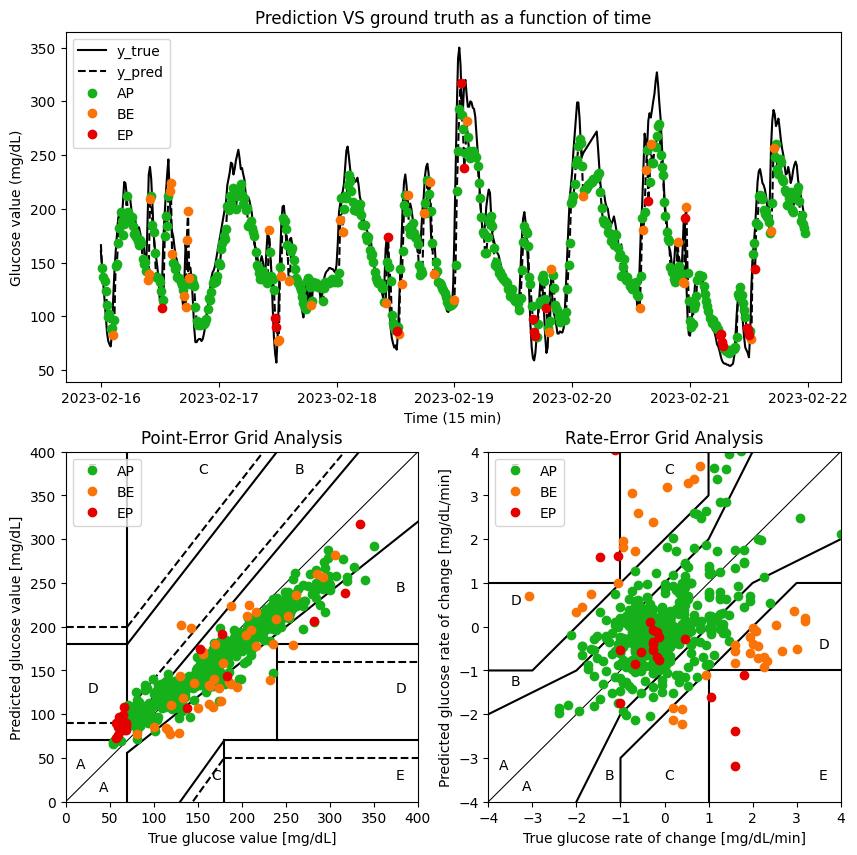

In [20]:
cg_ega = CG_EGA(dfPlot, 15)
print("AP, BE, EP:", cg_ega.reduced())
cg_ega.plot(day=5)

In [21]:
cg_ega.per_sample()

,datetime,y_true,y_pred,dy_true,dy_pred,CG_EGA,P_EGA,R_EGA
0,2023-02-16 00:00:00,160.454545,167.153549,NaN,NaN,NaN,NaN,NaN
1,2023-02-16 00:15:00,145.363636,145.020233,-1.006061,-1.475554,AP,A,A
2,2023-02-16 00:30:00,130.272727,136.161499,-1.006061,-0.590582,AP,A,A
3,2023-02-16 00:45:00,115.181818,132.589844,-1.006061,-0.238110,AP,A,A
4,2023-02-16 01:00:00,100.090909,123.476906,-1.006061,-0.607529,AP,A,A
...,...,...,...,...,...,...,...,...
3581,2023-03-25 07:15:00,188.000000,172.909210,-0.066667,-0.282433,AP,A,A
3582,2023-03-25 07:30:00,182.000000,169.933060,-0.400000,-0.198410,AP,A,A
3583,2023-03-25 07:45:00,171.000000,173.066101,-0.733333,0.208869,AP,A,A
3584,2023-03-25 08:00:00,167.000000,165.065720,-0.266667,-0.533359,AP,A,A


# Predicción a 60 min del conjunto de pruebas generales

In [22]:
lenHorizonte=2
XTest=[]
YTest=[]
for i in range(lenHorizonte):
    XTest.append(array_Xtest[i]) 
    YTest.append(array_Ytest[i]) 
XTest=np.reshape(XTest, (lenHorizonte, array_Xtest.shape[1],array_Xtest.shape[2]))

df_YTest = pd.DataFrame(YTest, columns=['Glucose level True'])

YTest_scaled=scalerGlucosa.inverse_transform(YTest)
df_YTest_scaled = pd.DataFrame(YTest_scaled, columns=['Glucose level True']) 

In [23]:
yhat = model.predict(XTest)
df_glucose = pd.DataFrame(yhat, columns=['Glucose level Predict'])
df_glucose['Glucose level True']=df_YTest['Glucose level True']
df_glucose.head()

1/1 [==============================] - 0s 68ms/step


,Glucose level Predict,Glucose level True
0,0.276421,0.261858
1,0.228305,0.229051


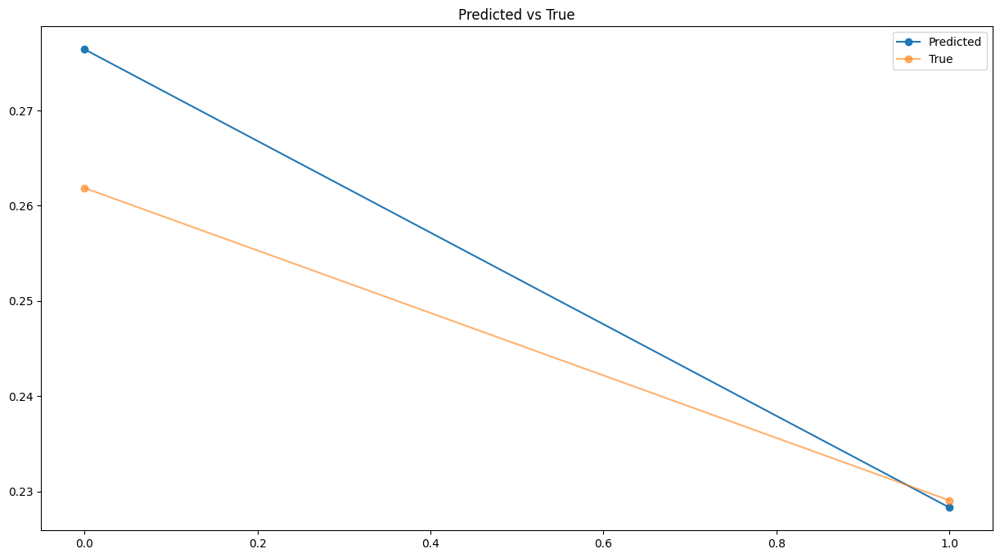

{'mae': 0.007654792494453472,
 'mse': 0.010311162453598342,
 'rmse': 0.00010632007114449619}

In [24]:
model_utils.plotPredicted(yhat,YTest)
model_utils.forecast_accuracy(yhat,YTest)

In [25]:
yhat_scaled=scalerGlucosa.inverse_transform(yhat)
df_glucose = pd.DataFrame(yhat_scaled, columns=['Glucose level Predict'])
df_glucose['Glucose level True']=df_YTest_scaled['Glucose level True']
df_glucose.head()

,Glucose level Predict,Glucose level True
0,167.153564,160.454545
1,145.020248,145.363636


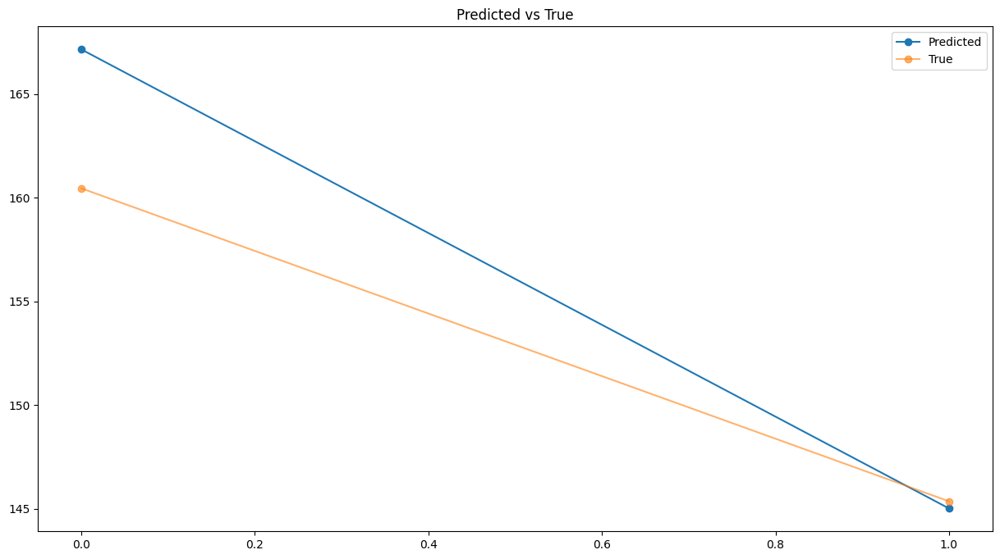

{'mae': 3.5212034745649987,
 'mse': 4.743140880677757,
 'rmse': 22.497385413956565}

In [26]:
model_utils.plotPredicted(yhat_scaled,YTest_scaled)
model_utils.forecast_accuracy(yhat_scaled,YTest_scaled)

# Pruebas Vanilla LSTM sin dropout

In [27]:
model = keras.models.load_model('modelos/'+paciente+'/vanilla_NO_dropout.h5')

In [28]:
from pickle import load
scalerGlucosa = load(open('dataset/generado/scalerGlucosa.scaler', 'rb'))

# Predicción de todo el conjunto de pruebas generales

In [29]:
len(array_Ytest)

3586

113/113 [==============================] - 1s 6ms/step


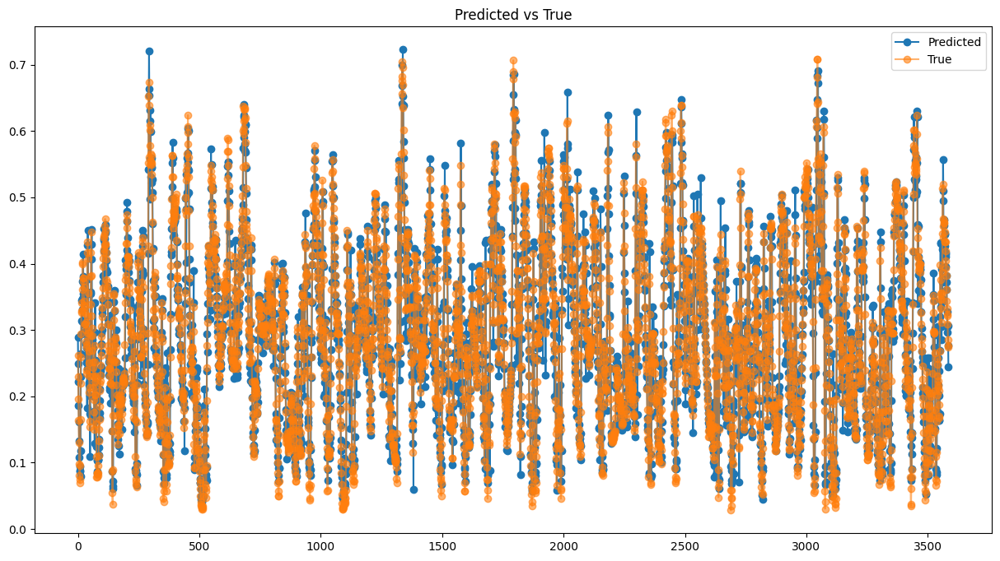

In [30]:
yhat = model.predict(array_Xtest)
model_utils.plotPredicted(yhat,array_Ytest)

In [31]:
model_utils.forecast_accuracy(yhat,array_Ytest)

{'mae': 0.03105966515951688,
 'mse': 0.04493260187363216,
 'rmse': 0.0020189387111343325}

In [32]:
yhat_scaled=scalerGlucosa.inverse_transform(yhat)
yhat_df = pd.DataFrame(yhat_scaled, columns=['Glucose level'])
yhat_df

,Glucose level
0,172.950745
1,154.451981
2,142.044037
3,125.529823
4,114.475632
...,...
3581,180.209015
3582,176.175507
3583,181.189941
3584,167.093796


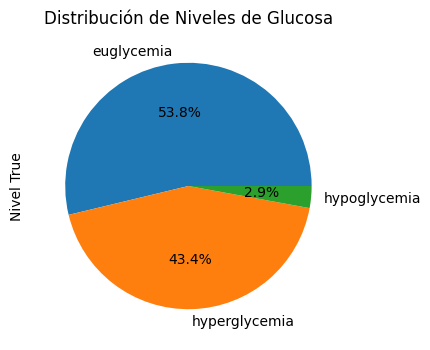

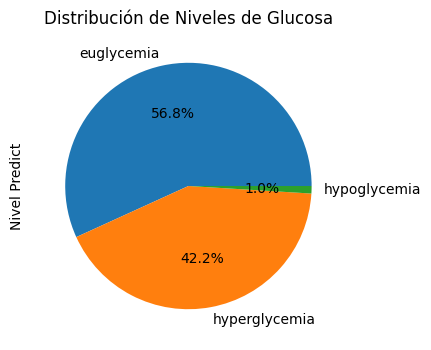

,Glucose level True,Nivel True,Glucose level Predict,Nivel Predict
0,160.454545,euglycemia,172.950745,euglycemia
1,145.363636,euglycemia,154.451981,euglycemia
2,130.272727,euglycemia,142.044037,euglycemia
3,115.181818,euglycemia,125.529823,euglycemia
4,100.090909,euglycemia,114.475632,euglycemia


In [33]:
Y_scaled=scalerGlucosa.inverse_transform(array_Ytest)
yhat_scaled=scalerGlucosa.inverse_transform(yhat)

df_glucose = pd.DataFrame(Y_scaled, columns=['Glucose level True']) 
df_glucose['Nivel True'] = df_glucose['Glucose level True'].apply(utils.label_LevelBG) 
df_glucose['Nivel True'].value_counts().plot.pie(title='Distribución de Niveles de Glucosa',y='level_label',legend=False,autopct='%1.1f%%',figsize=(10, 4))
plt.show()

df_glucose['Glucose level Predict']=yhat_scaled
df_glucose['Nivel Predict'] = df_glucose['Glucose level Predict'].apply(utils.label_LevelBG) 

df_glucose['Nivel Predict'].value_counts().plot.pie(title='Distribución de Niveles de Glucosa',y='level_label',legend=False,autopct='%1.1f%%',figsize=(10, 4))
plt.show()

df_glucose.head()


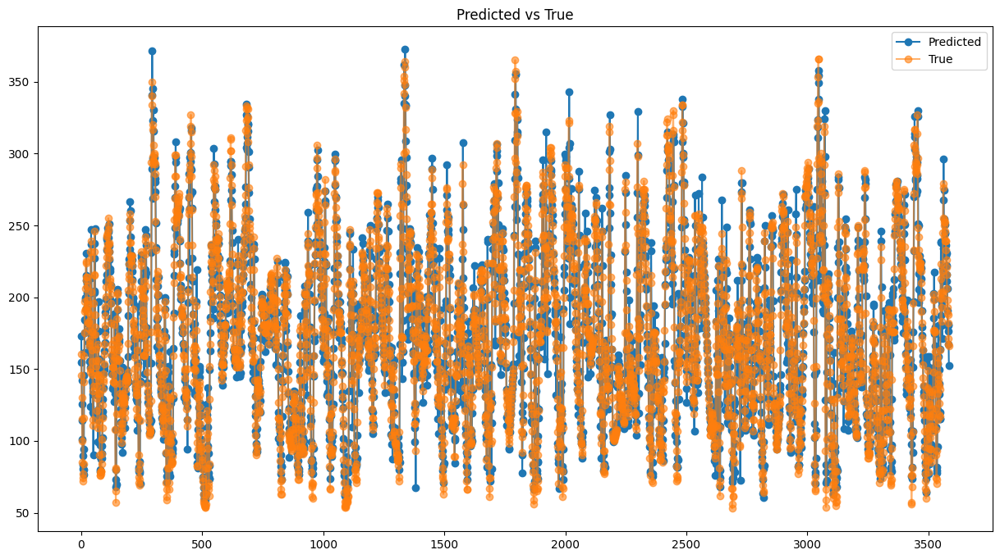

{'mae': 14.28744581750979, 'mse': 20.66899676937052, 'rmse': 427.2074274522489}

In [34]:
model_utils.plotPredicted(yhat_scaled,Y_scaled)
model_utils.forecast_accuracy(yhat_scaled,Y_scaled)

In [35]:
array_Ytest_scaled=scalerGlucosa.inverse_transform(array_Ytest)
array_Ytest_df = pd.DataFrame(array_Ytest_scaled, columns=['Glucose level'])
array_Ytest_df

,Glucose level
0,160.454545
1,145.363636
2,130.272727
3,115.181818
4,100.090909
...,...
3581,188.000000
3582,182.000000
3583,171.000000
3584,167.000000


In [36]:
dfPlot=pd.DataFrame()
dfPlot['y_true']=array_Ytest_df['Glucose level']
dfPlot['y_pred']=yhat_df['Glucose level']
dfPlot.index=pd.date_range("2023-01-01", periods=len(array_Ytest), freq="15min")
dfPlot

,y_true,y_pred
2023-01-01 00:00:00,160.454545,172.950745
2023-01-01 00:15:00,145.363636,154.451981
2023-01-01 00:30:00,130.272727,142.044037
2023-01-01 00:45:00,115.181818,125.529823
2023-01-01 01:00:00,100.090909,114.475632
...,...,...
2023-02-07 07:15:00,188.000000,180.209015
2023-02-07 07:30:00,182.000000,176.175507
2023-02-07 07:45:00,171.000000,181.189941
2023-02-07 08:00:00,167.000000,167.093796


AP, BE, EP: (0.8702928870292888, 0.08535564853556485, 0.04435146443514645)


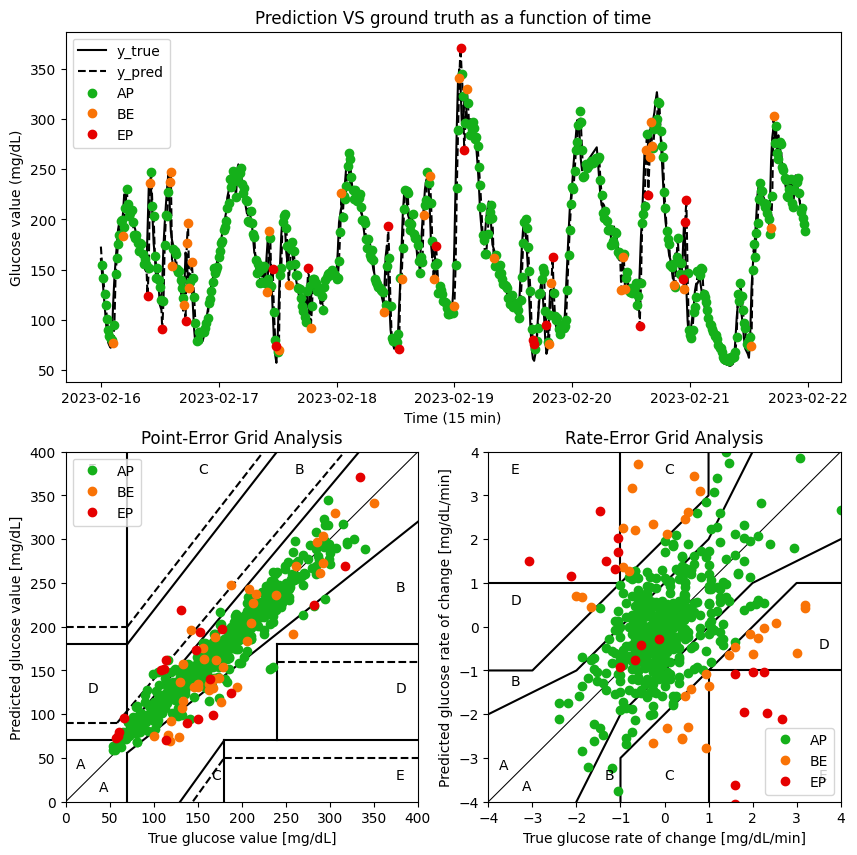

In [37]:
cg_ega = CG_EGA(dfPlot, 15)
print("AP, BE, EP:", cg_ega.reduced())
cg_ega.plot(day=5)

In [38]:
cg_ega.per_sample()

,datetime,y_true,y_pred,dy_true,dy_pred,CG_EGA,P_EGA,R_EGA
0,2023-02-16 00:00:00,160.454545,172.950745,NaN,NaN,NaN,NaN,NaN
1,2023-02-16 00:15:00,145.363636,154.451981,-1.006061,-1.233251,AP,A,A
2,2023-02-16 00:30:00,130.272727,142.044037,-1.006061,-0.827196,AP,A,A
3,2023-02-16 00:45:00,115.181818,125.529823,-1.006061,-1.100948,AP,A,A
4,2023-02-16 01:00:00,100.090909,114.475632,-1.006061,-0.736946,AP,A,A
...,...,...,...,...,...,...,...,...
3581,2023-03-25 07:15:00,188.000000,180.209015,-0.066667,-0.018743,AP,A,A
3582,2023-03-25 07:30:00,182.000000,176.175507,-0.400000,-0.268901,AP,A,A
3583,2023-03-25 07:45:00,171.000000,181.189941,-0.733333,0.334296,AP,A,B
3584,2023-03-25 08:00:00,167.000000,167.093796,-0.266667,-0.939743,AP,A,A


# Predicción a 60 min del conjunto de pruebas generales

In [39]:
lenHorizonte=2
XTest=[]
YTest=[]
for i in range(lenHorizonte):
    XTest.append(array_Xtest[i]) 
    YTest.append(array_Ytest[i]) 
XTest=np.reshape(XTest, (lenHorizonte, array_Xtest.shape[1],array_Xtest.shape[2]))

df_YTest = pd.DataFrame(YTest, columns=['Glucose level True'])

YTest_scaled=scalerGlucosa.inverse_transform(YTest)
df_YTest_scaled = pd.DataFrame(YTest_scaled, columns=['Glucose level True']) 

In [40]:
yhat = model.predict(XTest)
df_glucose = pd.DataFrame(yhat, columns=['Glucose level Predict'])
df_glucose['Glucose level True']=df_YTest['Glucose level True']
df_glucose.head()

1/1 [==============================] - 0s 24ms/step


,Glucose level Predict,Glucose level True
0,0.289023,0.261858
1,0.248809,0.229051


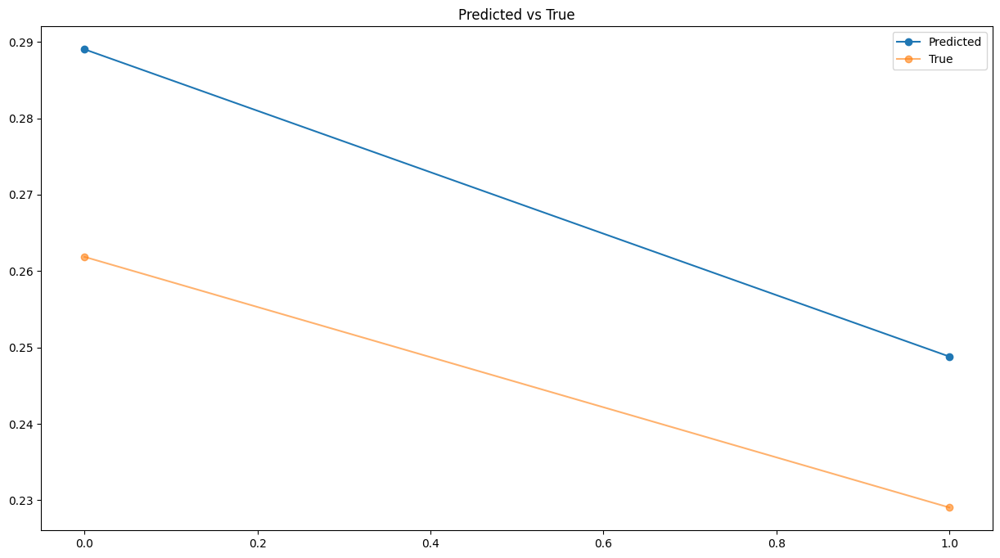

{'mae': 0.023461495204405353,
 'mse': 0.023752107468145975,
 'rmse': 0.0005641626091783558}

In [41]:
model_utils.plotPredicted(yhat,YTest)
model_utils.forecast_accuracy(yhat,YTest)

In [42]:
yhat_scaled=scalerGlucosa.inverse_transform(yhat)
df_glucose = pd.DataFrame(yhat_scaled, columns=['Glucose level Predict'])
df_glucose['Glucose level True']=df_YTest_scaled['Glucose level True']
df_glucose.head()

,Glucose level Predict,Glucose level True
0,172.950760,160.454545
1,154.452011,145.363636


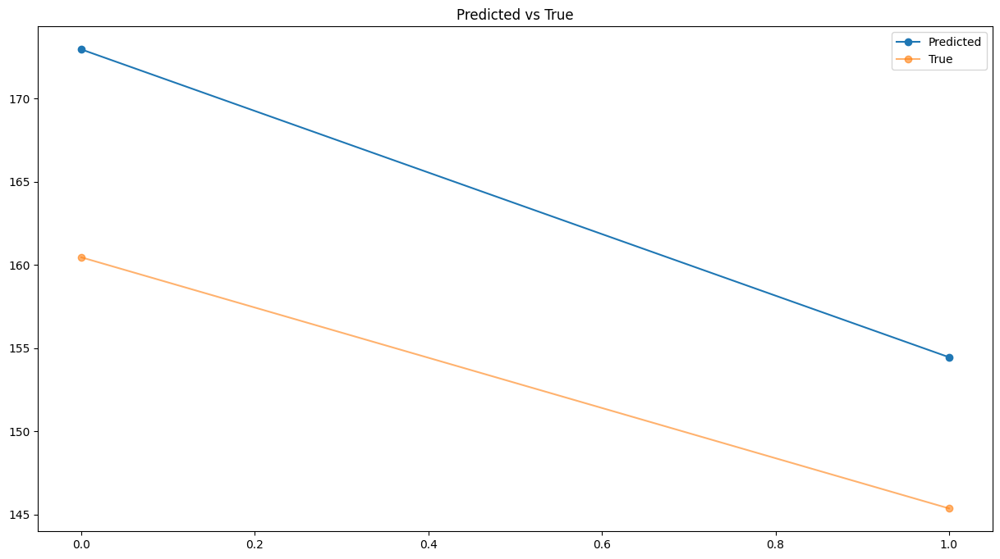

{'mae': 10.792294588955968,
 'mse': 10.925976630500637,
 'rmse': 119.37696533024605}

In [43]:
model_utils.plotPredicted(yhat_scaled,YTest_scaled)
model_utils.forecast_accuracy(yhat_scaled,YTest_scaled)

# Pruebas Stacked LSTM con dropout

In [44]:
model = keras.models.load_model('modelos/'+paciente+'/stacked_dropout.h5')

In [45]:
from pickle import load
scalerGlucosa = load(open('dataset/generado/scalerGlucosa.scaler', 'rb'))

# Predicción de todo el conjunto de pruebas generales

In [46]:
len(array_Ytest)

3586

113/113 [==============================] - 1s 8ms/step


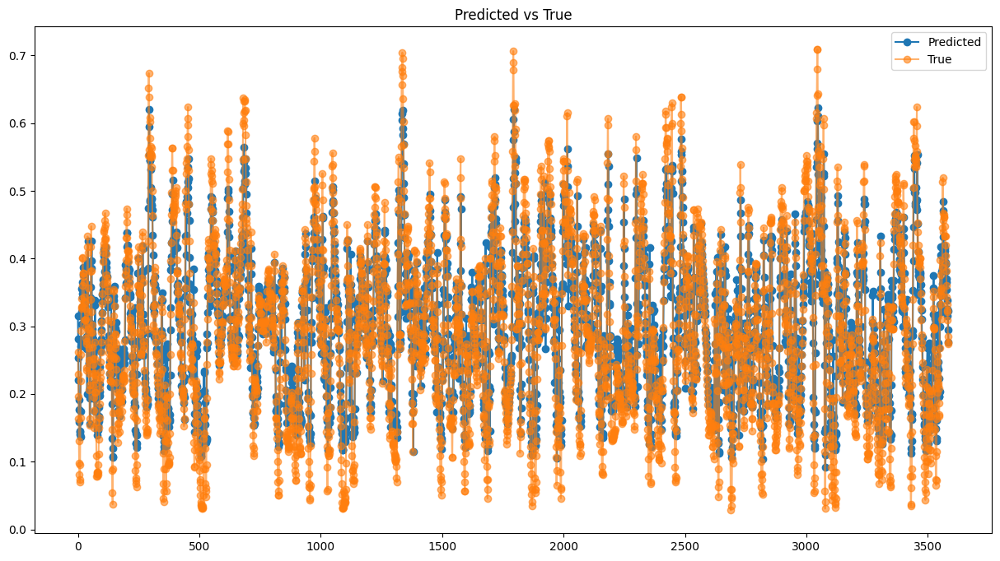

In [47]:
yhat = model.predict(array_Xtest)
model_utils.plotPredicted(yhat,array_Ytest)

In [48]:
model_utils.forecast_accuracy(yhat,array_Ytest)

{'mae': 0.04104259553712046,
 'mse': 0.05199941279607,
 'rmse': 0.0027039389311360887}

In [49]:
yhat_scaled=scalerGlucosa.inverse_transform(yhat)
yhat_df = pd.DataFrame(yhat_scaled, columns=['Glucose level'])
yhat_df

,Glucose level
0,185.077866
1,169.411057
2,156.294495
3,141.312332
4,127.901909
...,...
3581,189.452774
3582,185.234116
3583,188.519012
3584,175.616699


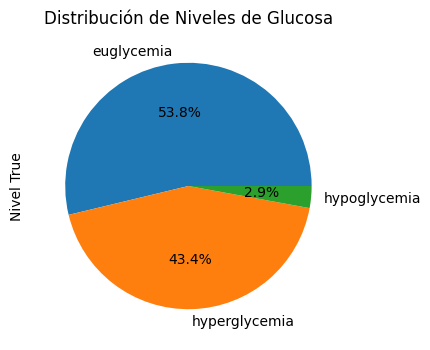

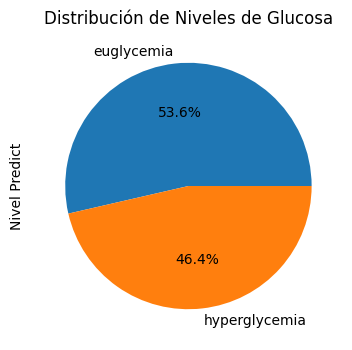

,Glucose level True,Nivel True,Glucose level Predict,Nivel Predict
0,160.454545,euglycemia,185.077866,hyperglycemia
1,145.363636,euglycemia,169.411057,euglycemia
2,130.272727,euglycemia,156.294495,euglycemia
3,115.181818,euglycemia,141.312332,euglycemia
4,100.090909,euglycemia,127.901909,euglycemia


In [50]:
Y_scaled=scalerGlucosa.inverse_transform(array_Ytest)
yhat_scaled=scalerGlucosa.inverse_transform(yhat)

df_glucose = pd.DataFrame(Y_scaled, columns=['Glucose level True']) 
df_glucose['Nivel True'] = df_glucose['Glucose level True'].apply(utils.label_LevelBG) 
df_glucose['Nivel True'].value_counts().plot.pie(title='Distribución de Niveles de Glucosa',y='level_label',legend=False,autopct='%1.1f%%',figsize=(10, 4))
plt.show()

df_glucose['Glucose level Predict']=yhat_scaled
df_glucose['Nivel Predict'] = df_glucose['Glucose level Predict'].apply(utils.label_LevelBG) 

df_glucose['Nivel Predict'].value_counts().plot.pie(title='Distribución de Niveles de Glucosa',y='level_label',legend=False,autopct='%1.1f%%',figsize=(10, 4))
plt.show()

df_glucose.head()


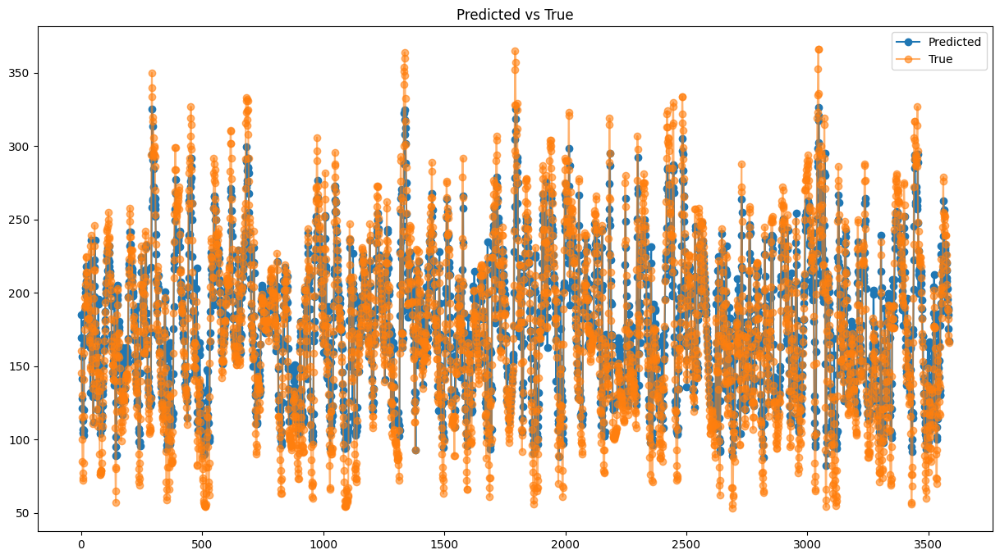

{'mae': 18.879594853278768,
 'mse': 23.91973058387678,
 'rmse': 572.1535112052502}

In [51]:
model_utils.plotPredicted(yhat_scaled,Y_scaled)
model_utils.forecast_accuracy(yhat_scaled,Y_scaled)

In [52]:
array_Ytest_scaled=scalerGlucosa.inverse_transform(array_Ytest)
array_Ytest_df = pd.DataFrame(array_Ytest_scaled, columns=['Glucose level'])
array_Ytest_df

,Glucose level
0,160.454545
1,145.363636
2,130.272727
3,115.181818
4,100.090909
...,...
3581,188.000000
3582,182.000000
3583,171.000000
3584,167.000000


In [53]:
dfPlot=pd.DataFrame()
dfPlot['y_true']=array_Ytest_df['Glucose level']
dfPlot['y_pred']=yhat_df['Glucose level']
dfPlot.index=pd.date_range("2023-01-01", periods=len(array_Ytest), freq="15min")
dfPlot

,y_true,y_pred
2023-01-01 00:00:00,160.454545,185.077866
2023-01-01 00:15:00,145.363636,169.411057
2023-01-01 00:30:00,130.272727,156.294495
2023-01-01 00:45:00,115.181818,141.312332
2023-01-01 01:00:00,100.090909,127.901909
...,...,...
2023-02-07 07:15:00,188.000000,189.452774
2023-02-07 07:30:00,182.000000,185.234116
2023-02-07 07:45:00,171.000000,188.519012
2023-02-07 08:00:00,167.000000,175.616699


AP, BE, EP: (0.8808926080892608, 0.06638772663877267, 0.052719665271966525)


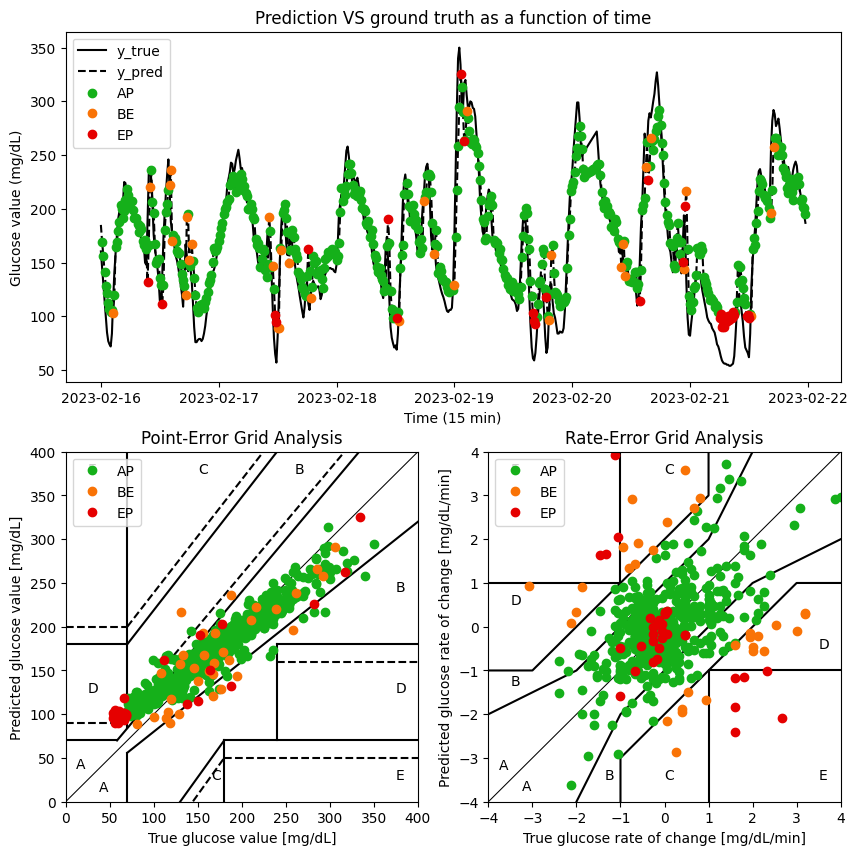

In [54]:
cg_ega = CG_EGA(dfPlot, 15)
print("AP, BE, EP:", cg_ega.reduced())
cg_ega.plot(day=5)

In [55]:
cg_ega.per_sample()

,datetime,y_true,y_pred,dy_true,dy_pred,CG_EGA,P_EGA,R_EGA
0,2023-02-16 00:00:00,160.454545,185.077866,NaN,NaN,NaN,NaN,NaN
1,2023-02-16 00:15:00,145.363636,169.411057,-1.006061,-1.044454,AP,A,A
2,2023-02-16 00:30:00,130.272727,156.294495,-1.006061,-0.874437,AP,A,A
3,2023-02-16 00:45:00,115.181818,141.312332,-1.006061,-0.998811,AP,A,A
4,2023-02-16 01:00:00,100.090909,127.901909,-1.006061,-0.894028,AP,A,A
...,...,...,...,...,...,...,...,...
3581,2023-03-25 07:15:00,188.000000,189.452774,-0.066667,-0.012198,AP,A,A
3582,2023-03-25 07:30:00,182.000000,185.234116,-0.400000,-0.281244,AP,A,A
3583,2023-03-25 07:45:00,171.000000,188.519012,-0.733333,0.218993,AP,A,A
3584,2023-03-25 08:00:00,167.000000,175.616699,-0.266667,-0.860154,AP,A,A


# Predicción a 60 min del conjunto de pruebas generales

In [56]:
lenHorizonte=2
XTest=[]
YTest=[]
for i in range(lenHorizonte):
    XTest.append(array_Xtest[i]) 
    YTest.append(array_Ytest[i]) 
XTest=np.reshape(XTest, (lenHorizonte, array_Xtest.shape[1],array_Xtest.shape[2]))

df_YTest = pd.DataFrame(YTest, columns=['Glucose level True'])

YTest_scaled=scalerGlucosa.inverse_transform(YTest)
df_YTest_scaled = pd.DataFrame(YTest_scaled, columns=['Glucose level True']) 

In [57]:
yhat = model.predict(XTest)
df_glucose = pd.DataFrame(yhat, columns=['Glucose level Predict'])
df_glucose['Glucose level True']=df_YTest['Glucose level True']
df_glucose.head()

1/1 [==============================] - 0s 37ms/step


,Glucose level Predict,Glucose level True
0,0.315387,0.261858
1,0.281328,0.229051


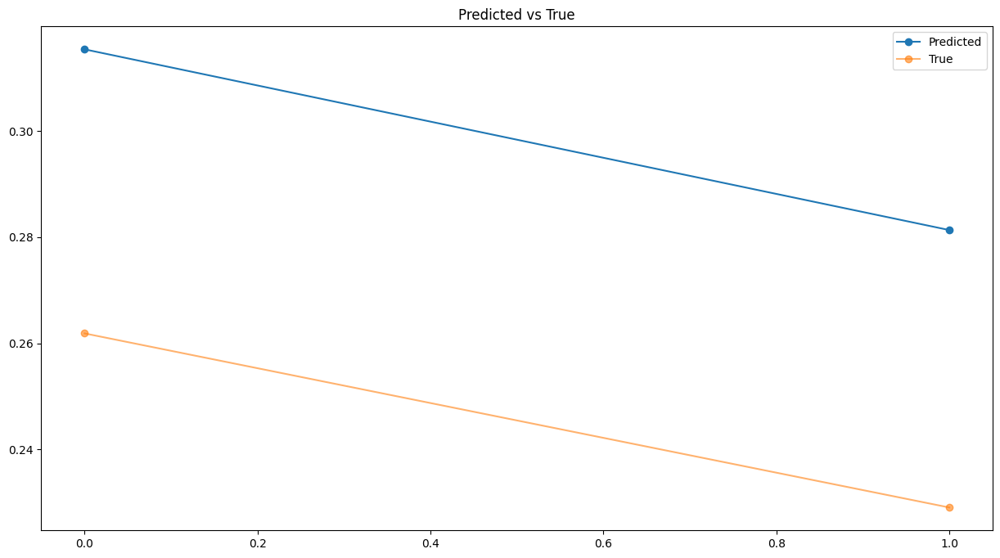

{'mae': 0.05290297107263045,
 'mse': 0.052906674716218724,
 'rmse': 0.002799116229527778}

In [58]:
model_utils.plotPredicted(yhat,YTest)
model_utils.forecast_accuracy(yhat,YTest)

In [59]:
yhat_scaled=scalerGlucosa.inverse_transform(yhat)
df_glucose = pd.DataFrame(yhat_scaled, columns=['Glucose level Predict'])
df_glucose['Glucose level True']=df_YTest_scaled['Glucose level True']
df_glucose.head()

,Glucose level Predict,Glucose level True
0,185.077881,160.454545
1,169.411041,145.363636


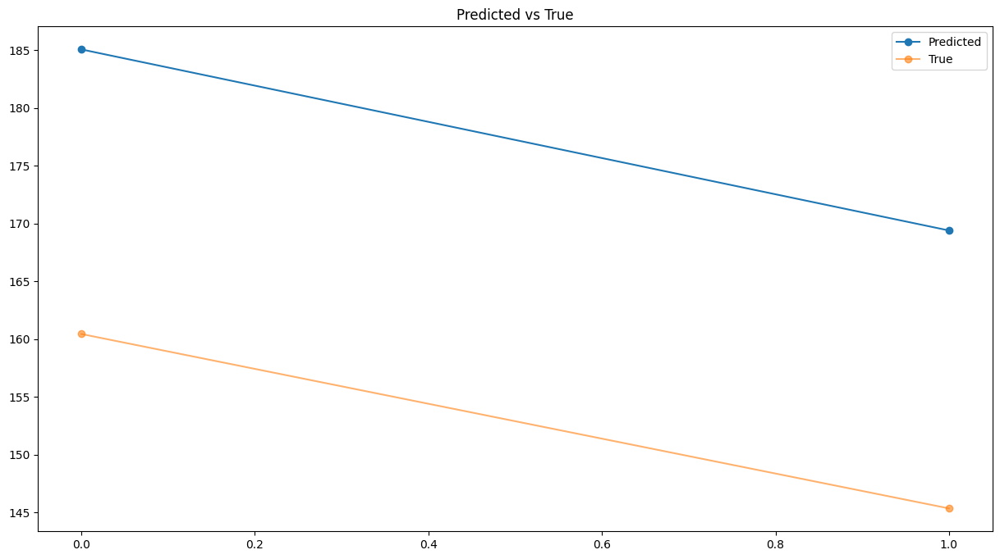

{'mae': 24.335370150479406, 'mse': 24.33707386578257, 'rmse': 592.293164348557}

In [60]:
model_utils.plotPredicted(yhat_scaled,YTest_scaled)
model_utils.forecast_accuracy(yhat_scaled,YTest_scaled)

# Pruebas Stacked LSTM sin dropout

In [61]:
model = keras.models.load_model('modelos/'+paciente+'/stacked_NO_dropout.h5')

In [62]:
from pickle import load
scalerGlucosa = load(open('dataset/generado/scalerGlucosa.scaler', 'rb'))

# Predicción de todo el conjunto de pruebas generales

In [63]:
len(array_Ytest)

3586

113/113 [==============================] - 1s 8ms/step


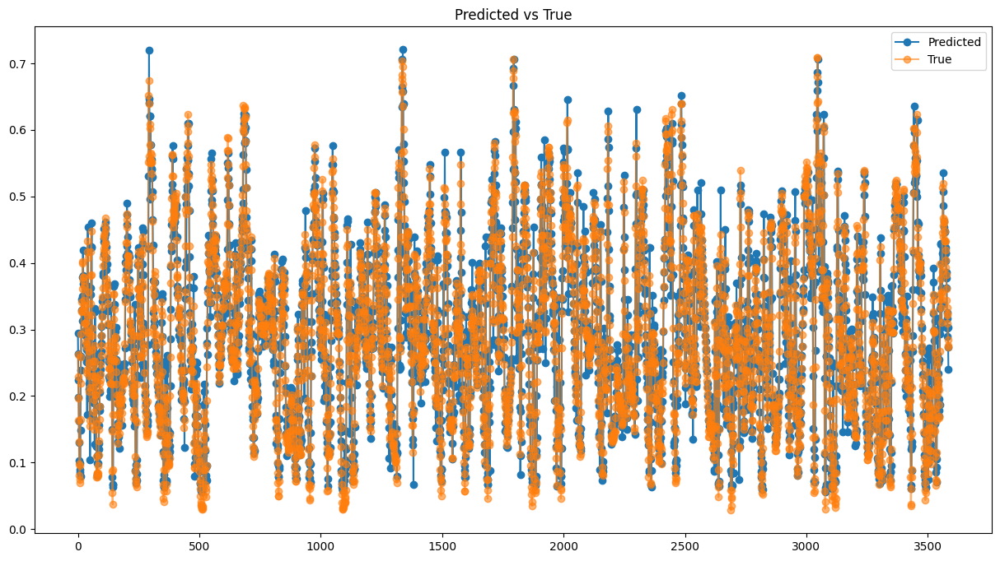

In [64]:
yhat = model.predict(array_Xtest)
model_utils.plotPredicted(yhat,array_Ytest)

In [65]:
model_utils.forecast_accuracy(yhat,array_Ytest)

{'mae': 0.031296093101864694,
 'mse': 0.04423690665336412,
 'rmse': 0.0019569039102584505}

In [66]:
yhat_scaled=scalerGlucosa.inverse_transform(yhat)
yhat_df = pd.DataFrame(yhat_scaled, columns=['Glucose level'])
yhat_df

,Glucose level
0,175.463348
1,161.386490
2,143.041321
3,130.959198
4,114.443001
...,...
3581,179.131180
3582,173.241684
3583,179.543777
3584,165.907166


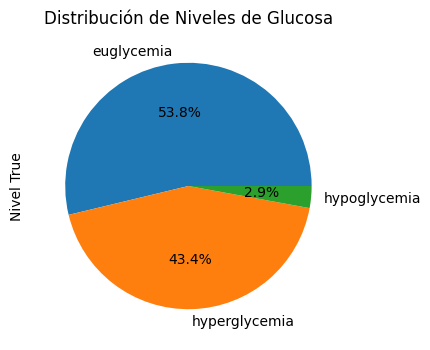

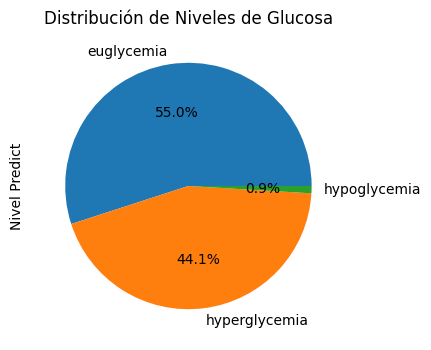

,Glucose level True,Nivel True,Glucose level Predict,Nivel Predict
0,160.454545,euglycemia,175.463348,euglycemia
1,145.363636,euglycemia,161.386490,euglycemia
2,130.272727,euglycemia,143.041321,euglycemia
3,115.181818,euglycemia,130.959198,euglycemia
4,100.090909,euglycemia,114.443001,euglycemia


In [67]:
Y_scaled=scalerGlucosa.inverse_transform(array_Ytest)
yhat_scaled=scalerGlucosa.inverse_transform(yhat)

df_glucose = pd.DataFrame(Y_scaled, columns=['Glucose level True']) 
df_glucose['Nivel True'] = df_glucose['Glucose level True'].apply(utils.label_LevelBG) 
df_glucose['Nivel True'].value_counts().plot.pie(title='Distribución de Niveles de Glucosa',y='level_label',legend=False,autopct='%1.1f%%',figsize=(10, 4))
plt.show()

df_glucose['Glucose level Predict']=yhat_scaled
df_glucose['Nivel Predict'] = df_glucose['Glucose level Predict'].apply(utils.label_LevelBG) 

df_glucose['Nivel Predict'].value_counts().plot.pie(title='Distribución de Niveles de Glucosa',y='level_label',legend=False,autopct='%1.1f%%',figsize=(10, 4))
plt.show()

df_glucose.head()


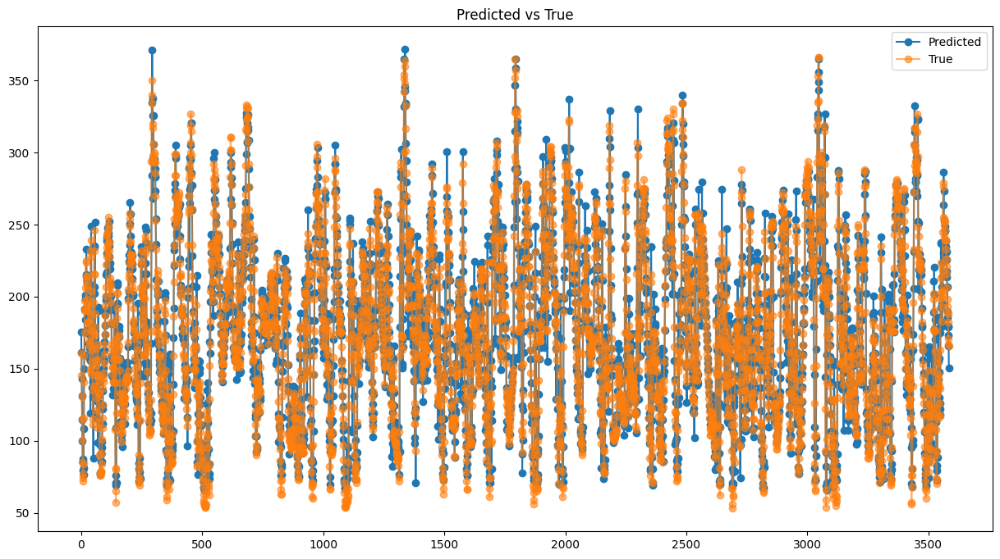

{'mae': 14.396202750714735,
 'mse': 20.348976977622005,
 'rmse': 414.08086403579046}

In [68]:
model_utils.plotPredicted(yhat_scaled,Y_scaled)
model_utils.forecast_accuracy(yhat_scaled,Y_scaled)

In [69]:
array_Ytest_scaled=scalerGlucosa.inverse_transform(array_Ytest)
array_Ytest_df = pd.DataFrame(array_Ytest_scaled, columns=['Glucose level'])
array_Ytest_df

,Glucose level
0,160.454545
1,145.363636
2,130.272727
3,115.181818
4,100.090909
...,...
3581,188.000000
3582,182.000000
3583,171.000000
3584,167.000000


In [70]:
dfPlot=pd.DataFrame()
dfPlot['y_true']=array_Ytest_df['Glucose level']
dfPlot['y_pred']=yhat_df['Glucose level']
dfPlot.index=pd.date_range("2023-01-01", periods=len(array_Ytest), freq="15min")
dfPlot

,y_true,y_pred
2023-01-01 00:00:00,160.454545,175.463348
2023-01-01 00:15:00,145.363636,161.386490
2023-01-01 00:30:00,130.272727,143.041321
2023-01-01 00:45:00,115.181818,130.959198
2023-01-01 01:00:00,100.090909,114.443001
...,...,...
2023-02-07 07:15:00,188.000000,179.131180
2023-02-07 07:30:00,182.000000,173.241684
2023-02-07 07:45:00,171.000000,179.543777
2023-02-07 08:00:00,167.000000,165.907166


AP, BE, EP: (0.8655509065550907, 0.09037656903765691, 0.04407252440725244)


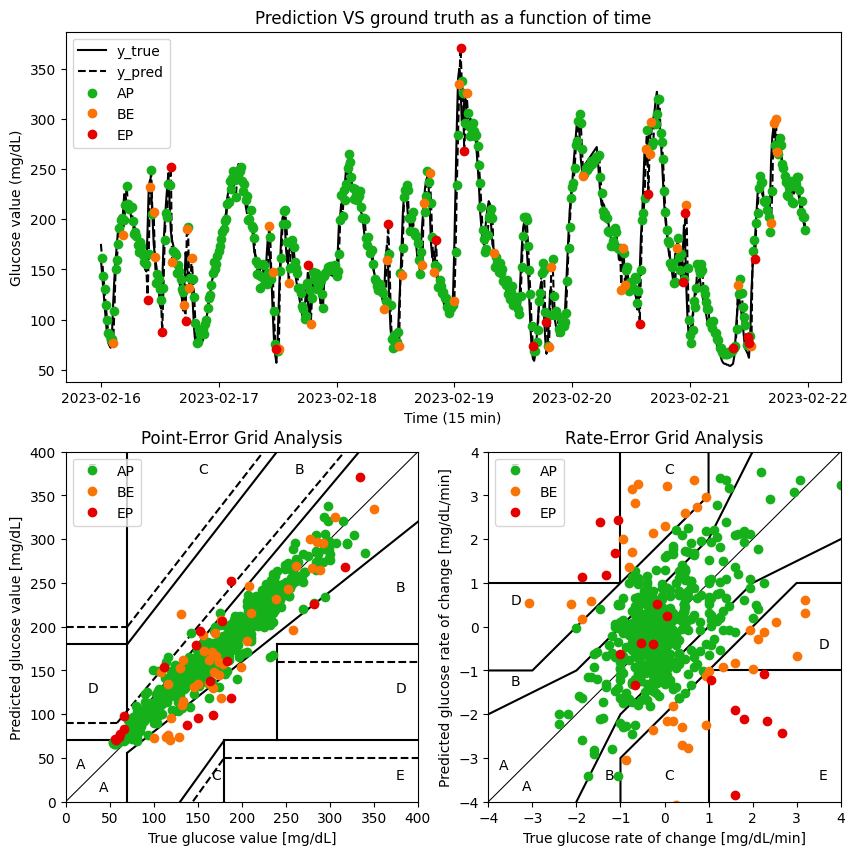

In [71]:
cg_ega = CG_EGA(dfPlot, 15)
print("AP, BE, EP:", cg_ega.reduced())
cg_ega.plot(day=5)

In [72]:
cg_ega.per_sample()

,datetime,y_true,y_pred,dy_true,dy_pred,CG_EGA,P_EGA,R_EGA
0,2023-02-16 00:00:00,160.454545,175.463348,NaN,NaN,NaN,NaN,NaN
1,2023-02-16 00:15:00,145.363636,161.386490,-1.006061,-0.938457,AP,A,A
2,2023-02-16 00:30:00,130.272727,143.041321,-1.006061,-1.223011,AP,A,A
3,2023-02-16 00:45:00,115.181818,130.959198,-1.006061,-0.805475,AP,A,A
4,2023-02-16 01:00:00,100.090909,114.443001,-1.006061,-1.101080,AP,A,A
...,...,...,...,...,...,...,...,...
3581,2023-03-25 07:15:00,188.000000,179.131180,-0.066667,-0.419907,AP,A,A
3582,2023-03-25 07:30:00,182.000000,173.241684,-0.400000,-0.392633,AP,A,A
3583,2023-03-25 07:45:00,171.000000,179.543777,-0.733333,0.420140,AP,A,B
3584,2023-03-25 08:00:00,167.000000,165.907166,-0.266667,-0.909107,AP,A,A


# Predicción a 60 min del conjunto de pruebas generales

In [73]:
lenHorizonte=2
XTest=[]
YTest=[]
for i in range(lenHorizonte):
    XTest.append(array_Xtest[i]) 
    YTest.append(array_Ytest[i]) 
XTest=np.reshape(XTest, (lenHorizonte, array_Xtest.shape[1],array_Xtest.shape[2]))

df_YTest = pd.DataFrame(YTest, columns=['Glucose level True'])

YTest_scaled=scalerGlucosa.inverse_transform(YTest)
df_YTest_scaled = pd.DataFrame(YTest_scaled, columns=['Glucose level True']) 

In [74]:
yhat = model.predict(XTest)
df_glucose = pd.DataFrame(yhat, columns=['Glucose level Predict'])
df_glucose['Glucose level True']=df_YTest['Glucose level True']
df_glucose.head()

1/1 [==============================] - 0s 25ms/step


,Glucose level Predict,Glucose level True
0,0.294485,0.261858
1,0.263884,0.229051


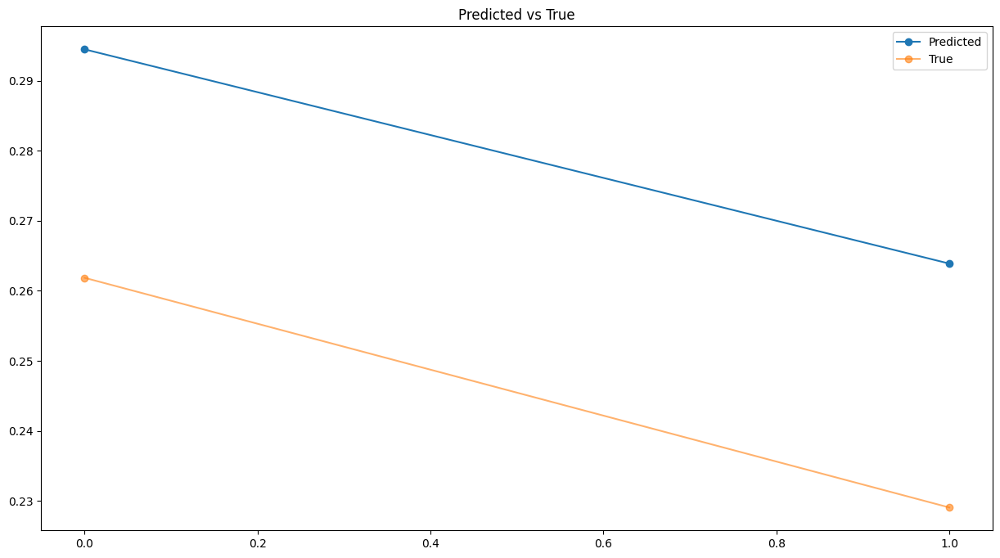

{'mae': 0.03373000459237532,
 'mse': 0.03374801116666609,
 'rmse': 0.001138928257705419}

In [75]:
model_utils.plotPredicted(yhat,YTest)
model_utils.forecast_accuracy(yhat,YTest)

In [76]:
yhat_scaled=scalerGlucosa.inverse_transform(yhat)
df_glucose = pd.DataFrame(yhat_scaled, columns=['Glucose level Predict'])
df_glucose['Glucose level True']=df_YTest_scaled['Glucose level True']
df_glucose.head()

,Glucose level Predict,Glucose level True
0,175.463303,160.454545
1,161.386490,145.363636


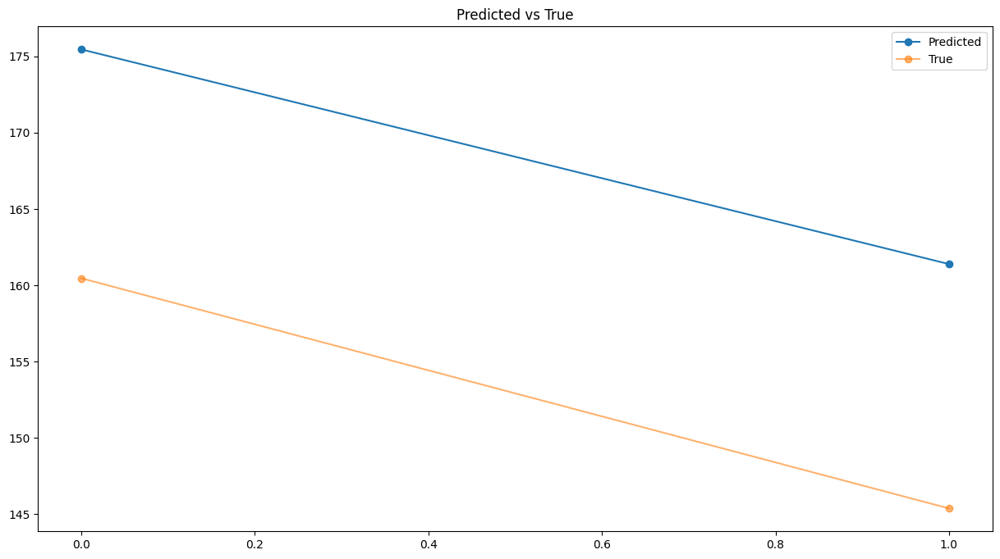

{'mae': 15.515805331143468,
 'mse': 15.524088151130563,
 'rmse': 240.99731292407233}

In [77]:
model_utils.plotPredicted(yhat_scaled,YTest_scaled)
model_utils.forecast_accuracy(yhat_scaled,YTest_scaled)

# Pruebas Bidirectional LSTM con dropout

In [78]:
model = keras.models.load_model('modelos/'+paciente+'/bidirectional_dropout.h5')

In [79]:
from pickle import load
scalerGlucosa = load(open('dataset/generado/scalerGlucosa.scaler', 'rb'))

# Predicción de todo el conjunto de pruebas generales

In [80]:
len(array_Ytest)

3586

113/113 [==============================] - 1s 6ms/step


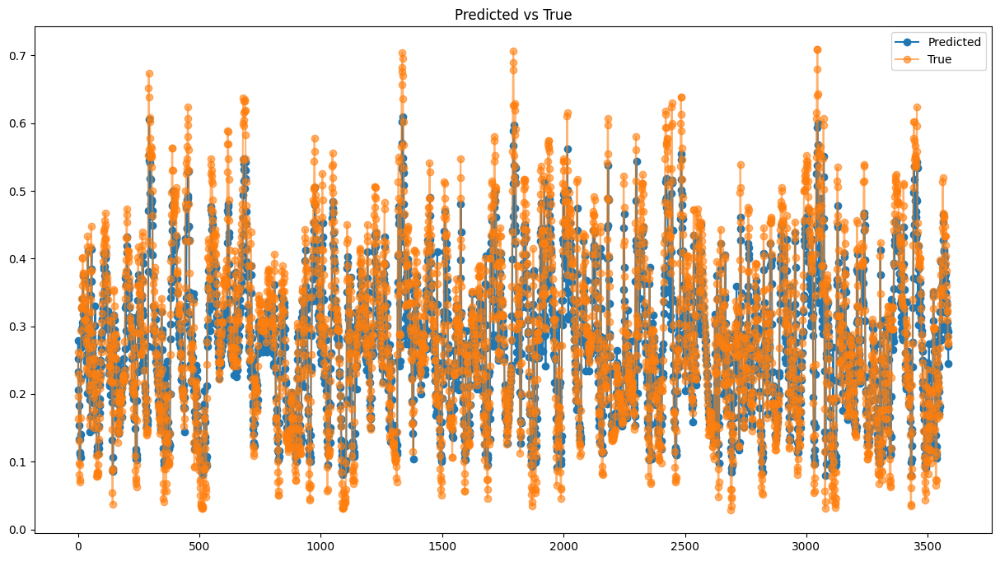

In [81]:
yhat = model.predict(array_Xtest)
model_utils.plotPredicted(yhat,array_Ytest)

In [82]:
model_utils.forecast_accuracy(yhat,array_Ytest)

{'mae': 0.042192632037454283,
 'mse': 0.055429860761645675,
 'rmse': 0.003072469464055427}

In [83]:
yhat_scaled=scalerGlucosa.inverse_transform(yhat)
yhat_df = pd.DataFrame(yhat_scaled, columns=['Glucose level'])
yhat_df

,Glucose level
0,168.544189
1,156.206039
2,146.796875
3,134.932114
4,124.009010
...,...
3581,174.612839
3582,171.153381
3583,174.413986
3584,164.290253


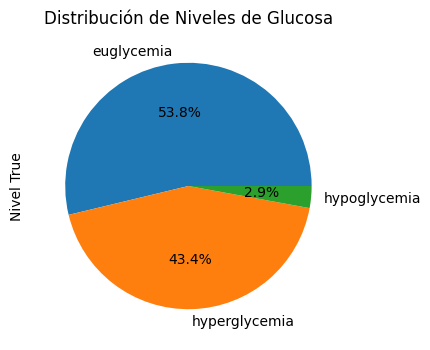

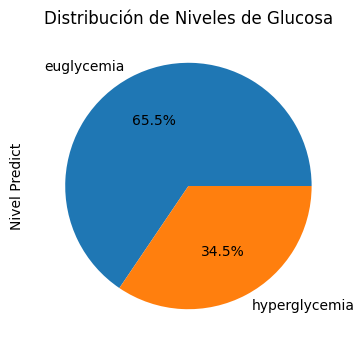

,Glucose level True,Nivel True,Glucose level Predict,Nivel Predict
0,160.454545,euglycemia,168.544189,euglycemia
1,145.363636,euglycemia,156.206039,euglycemia
2,130.272727,euglycemia,146.796875,euglycemia
3,115.181818,euglycemia,134.932114,euglycemia
4,100.090909,euglycemia,124.009010,euglycemia


In [84]:
Y_scaled=scalerGlucosa.inverse_transform(array_Ytest)
yhat_scaled=scalerGlucosa.inverse_transform(yhat)

df_glucose = pd.DataFrame(Y_scaled, columns=['Glucose level True']) 
df_glucose['Nivel True'] = df_glucose['Glucose level True'].apply(utils.label_LevelBG) 
df_glucose['Nivel True'].value_counts().plot.pie(title='Distribución de Niveles de Glucosa',y='level_label',legend=False,autopct='%1.1f%%',figsize=(10, 4))
plt.show()

df_glucose['Glucose level Predict']=yhat_scaled
df_glucose['Nivel Predict'] = df_glucose['Glucose level Predict'].apply(utils.label_LevelBG) 

df_glucose['Nivel Predict'].value_counts().plot.pie(title='Distribución de Niveles de Glucosa',y='level_label',legend=False,autopct='%1.1f%%',figsize=(10, 4))
plt.show()

df_glucose.head()


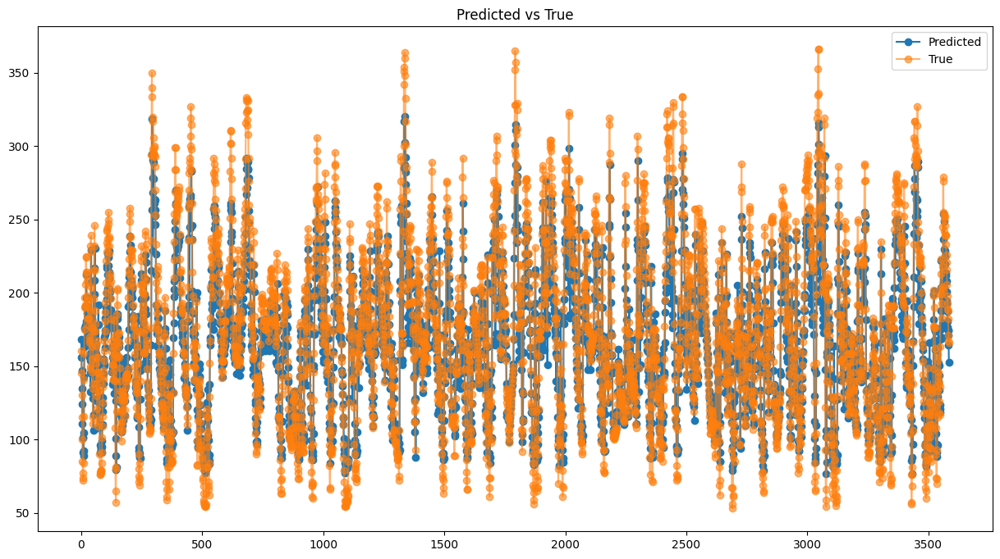

{'mae': 19.408609935142596,
 'mse': 25.497735262234176,
 'rmse': 650.1345035029801}

In [85]:
model_utils.plotPredicted(yhat_scaled,Y_scaled)
model_utils.forecast_accuracy(yhat_scaled,Y_scaled)

In [86]:
array_Ytest_scaled=scalerGlucosa.inverse_transform(array_Ytest)
array_Ytest_df = pd.DataFrame(array_Ytest_scaled, columns=['Glucose level'])
array_Ytest_df

,Glucose level
0,160.454545
1,145.363636
2,130.272727
3,115.181818
4,100.090909
...,...
3581,188.000000
3582,182.000000
3583,171.000000
3584,167.000000


In [87]:
dfPlot=pd.DataFrame()
dfPlot['y_true']=array_Ytest_df['Glucose level']
dfPlot['y_pred']=yhat_df['Glucose level']
dfPlot.index=pd.date_range("2023-01-01", periods=len(array_Ytest), freq="15min")
dfPlot

,y_true,y_pred
2023-01-01 00:00:00,160.454545,168.544189
2023-01-01 00:15:00,145.363636,156.206039
2023-01-01 00:30:00,130.272727,146.796875
2023-01-01 00:45:00,115.181818,134.932114
2023-01-01 01:00:00,100.090909,124.009010
...,...,...
2023-02-07 07:15:00,188.000000,174.612839
2023-02-07 07:30:00,182.000000,171.153381
2023-02-07 07:45:00,171.000000,174.413986
2023-02-07 08:00:00,167.000000,164.290253


AP, BE, EP: (0.8691771269177127, 0.07866108786610879, 0.05216178521617852)


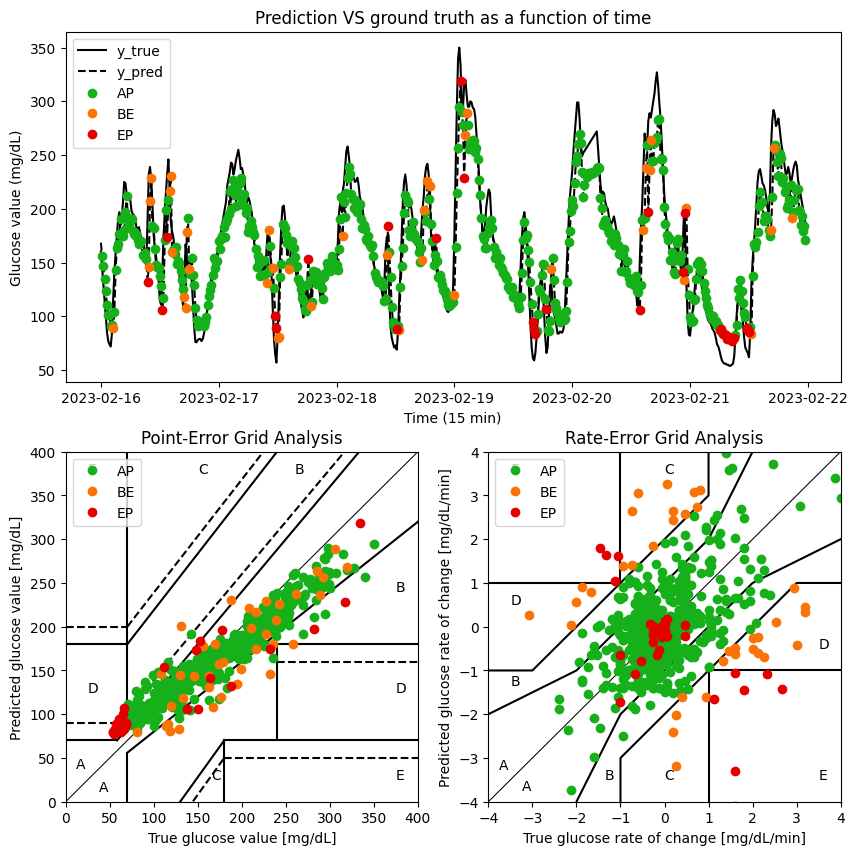

In [88]:
cg_ega = CG_EGA(dfPlot, 15)
print("AP, BE, EP:", cg_ega.reduced())
cg_ega.plot(day=5)

In [89]:
cg_ega.per_sample()

,datetime,y_true,y_pred,dy_true,dy_pred,CG_EGA,P_EGA,R_EGA
0,2023-02-16 00:00:00,160.454545,168.544189,NaN,NaN,NaN,NaN,NaN
1,2023-02-16 00:15:00,145.363636,156.206039,-1.006061,-0.822543,AP,A,A
2,2023-02-16 00:30:00,130.272727,146.796875,-1.006061,-0.627278,AP,A,A
3,2023-02-16 00:45:00,115.181818,134.932114,-1.006061,-0.790984,AP,A,A
4,2023-02-16 01:00:00,100.090909,124.009010,-1.006061,-0.728207,AP,A,A
...,...,...,...,...,...,...,...,...
3581,2023-03-25 07:15:00,188.000000,174.612839,-0.066667,-0.136779,AP,A,A
3582,2023-03-25 07:30:00,182.000000,171.153381,-0.400000,-0.230630,AP,A,A
3583,2023-03-25 07:45:00,171.000000,174.413986,-0.733333,0.217374,AP,A,A
3584,2023-03-25 08:00:00,167.000000,164.290253,-0.266667,-0.674916,AP,A,A


# Predicción a 60 min del conjunto de pruebas generales

In [90]:
lenHorizonte=2
XTest=[]
YTest=[]
for i in range(lenHorizonte):
    XTest.append(array_Xtest[i]) 
    YTest.append(array_Ytest[i]) 
XTest=np.reshape(XTest, (lenHorizonte, array_Xtest.shape[1],array_Xtest.shape[2]))

df_YTest = pd.DataFrame(YTest, columns=['Glucose level True'])

YTest_scaled=scalerGlucosa.inverse_transform(YTest)
df_YTest_scaled = pd.DataFrame(YTest_scaled, columns=['Glucose level True']) 

In [91]:
yhat = model.predict(XTest)
df_glucose = pd.DataFrame(yhat, columns=['Glucose level Predict'])
df_glucose['Glucose level True']=df_YTest['Glucose level True']
df_glucose.head()

1/1 [==============================] - 0s 32ms/step


,Glucose level Predict,Glucose level True
0,0.279444,0.261858
1,0.252622,0.229051


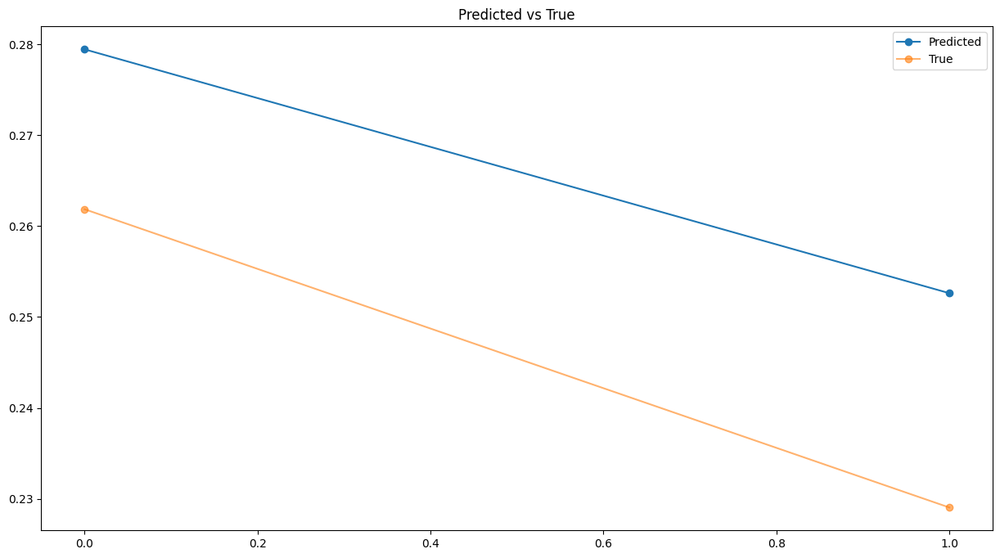

{'mae': 0.020578299327330157,
 'mse': 0.020794695130666948,
 'rmse': 0.00043241934557738373}

In [92]:
model_utils.plotPredicted(yhat,YTest)
model_utils.forecast_accuracy(yhat,YTest)

In [93]:
yhat_scaled=scalerGlucosa.inverse_transform(yhat)
df_glucose = pd.DataFrame(yhat_scaled, columns=['Glucose level Predict'])
df_glucose['Glucose level True']=df_YTest_scaled['Glucose level True']
df_glucose.head()

,Glucose level Predict,Glucose level True
0,168.544174,160.454545
1,156.206039,145.363636


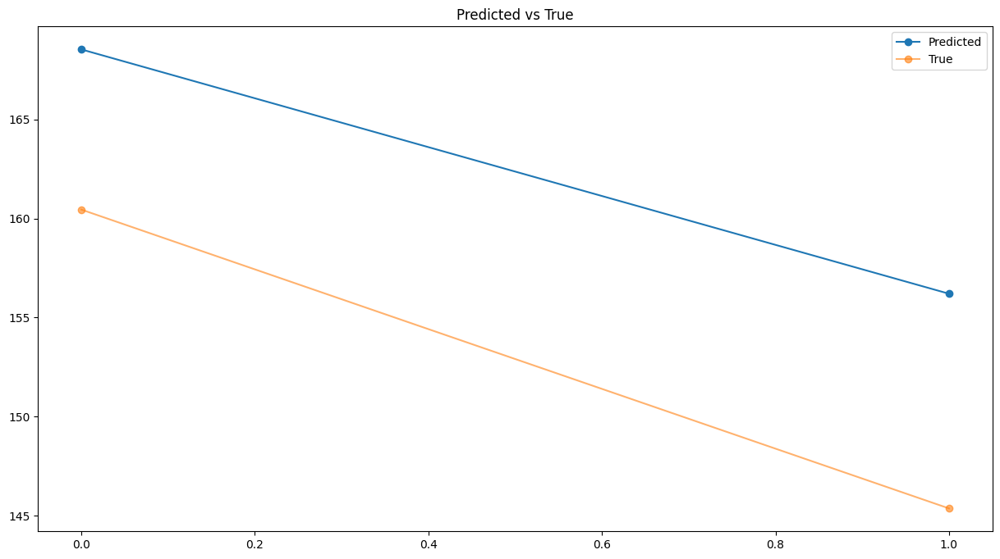

{'mae': 9.466015902432531, 'mse': 9.565557939116324, 'rmse': 91.49989868659135}

In [94]:
model_utils.plotPredicted(yhat_scaled,YTest_scaled)
model_utils.forecast_accuracy(yhat_scaled,YTest_scaled)

# Pruebas Bidirectional LSTM sin dropout

In [95]:
model = keras.models.load_model('modelos/'+paciente+'/bidirectional_NO_dropout.h5')

In [96]:
from pickle import load
scalerGlucosa = load(open('dataset/generado/scalerGlucosa.scaler', 'rb'))

# Predicción de todo el conjunto de pruebas generales

In [97]:
len(array_Ytest)

3586

113/113 [==============================] - 1s 5ms/step


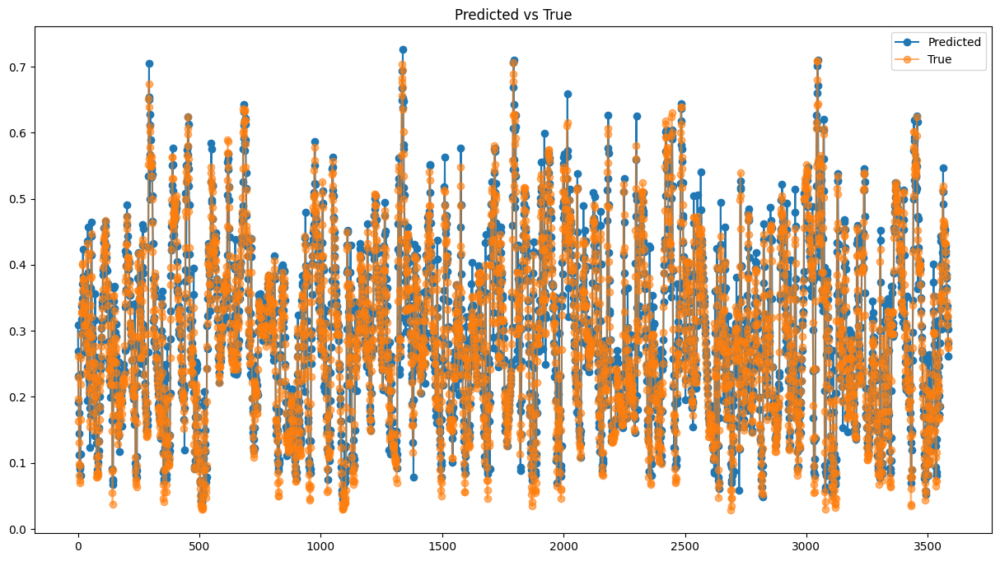

In [98]:
yhat = model.predict(array_Xtest)
model_utils.plotPredicted(yhat,array_Ytest)

In [99]:
model_utils.forecast_accuracy(yhat,array_Ytest)

{'mae': 0.032028520718067485,
 'mse': 0.0447401946446019,
 'rmse': 0.002001685016836864}

In [100]:
yhat_scaled=scalerGlucosa.inverse_transform(yhat)
yhat_df = pd.DataFrame(yhat_scaled, columns=['Glucose level'])
yhat_df

,Glucose level
0,182.371368
1,163.720169
2,146.308716
3,128.215302
4,120.924911
...,...
3581,185.042770
3582,182.780243
3583,179.514923
3584,169.674103


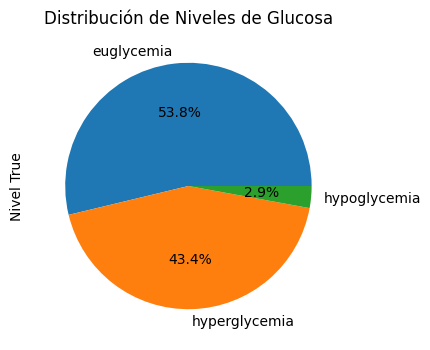

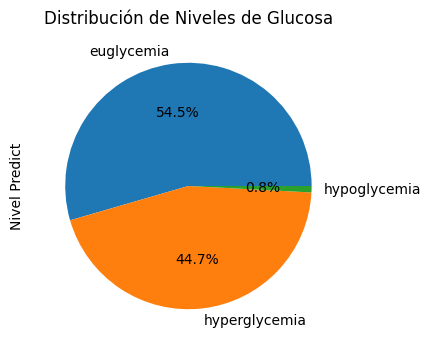

,Glucose level True,Nivel True,Glucose level Predict,Nivel Predict
0,160.454545,euglycemia,182.371368,hyperglycemia
1,145.363636,euglycemia,163.720169,euglycemia
2,130.272727,euglycemia,146.308716,euglycemia
3,115.181818,euglycemia,128.215302,euglycemia
4,100.090909,euglycemia,120.924911,euglycemia


In [101]:
Y_scaled=scalerGlucosa.inverse_transform(array_Ytest)
yhat_scaled=scalerGlucosa.inverse_transform(yhat)

df_glucose = pd.DataFrame(Y_scaled, columns=['Glucose level True']) 
df_glucose['Nivel True'] = df_glucose['Glucose level True'].apply(utils.label_LevelBG) 
df_glucose['Nivel True'].value_counts().plot.pie(title='Distribución de Niveles de Glucosa',y='level_label',legend=False,autopct='%1.1f%%',figsize=(10, 4))
plt.show()

df_glucose['Glucose level Predict']=yhat_scaled
df_glucose['Nivel Predict'] = df_glucose['Glucose level Predict'].apply(utils.label_LevelBG) 

df_glucose['Nivel Predict'].value_counts().plot.pie(title='Distribución de Niveles de Glucosa',y='level_label',legend=False,autopct='%1.1f%%',figsize=(10, 4))
plt.show()

df_glucose.head()


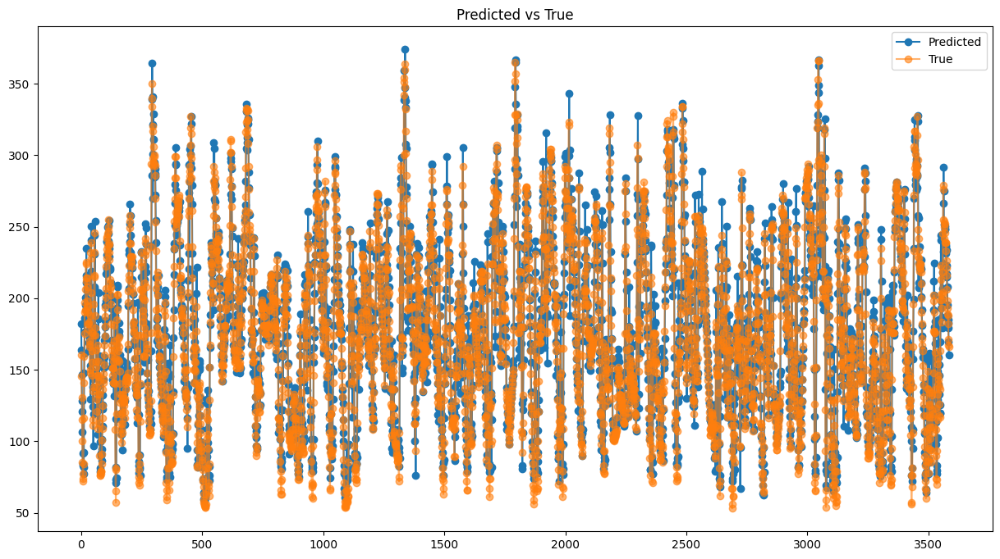

{'mae': 14.733119673775235,
 'mse': 20.580489611024973,
 'rmse': 423.5565526295069}

In [102]:
model_utils.plotPredicted(yhat_scaled,Y_scaled)
model_utils.forecast_accuracy(yhat_scaled,Y_scaled)

In [103]:
array_Ytest_scaled=scalerGlucosa.inverse_transform(array_Ytest)
array_Ytest_df = pd.DataFrame(array_Ytest_scaled, columns=['Glucose level'])
array_Ytest_df

,Glucose level
0,160.454545
1,145.363636
2,130.272727
3,115.181818
4,100.090909
...,...
3581,188.000000
3582,182.000000
3583,171.000000
3584,167.000000


In [104]:
dfPlot=pd.DataFrame()
dfPlot['y_true']=array_Ytest_df['Glucose level']
dfPlot['y_pred']=yhat_df['Glucose level']
dfPlot.index=pd.date_range("2023-01-01", periods=len(array_Ytest), freq="15min")
dfPlot

,y_true,y_pred
2023-01-01 00:00:00,160.454545,182.371368
2023-01-01 00:15:00,145.363636,163.720169
2023-01-01 00:30:00,130.272727,146.308716
2023-01-01 00:45:00,115.181818,128.215302
2023-01-01 01:00:00,100.090909,120.924911
...,...,...
2023-02-07 07:15:00,188.000000,185.042770
2023-02-07 07:30:00,182.000000,182.780243
2023-02-07 07:45:00,171.000000,179.514923
2023-02-07 08:00:00,167.000000,169.674103


AP, BE, EP: (0.8661087866108786, 0.08786610878661087, 0.04602510460251046)


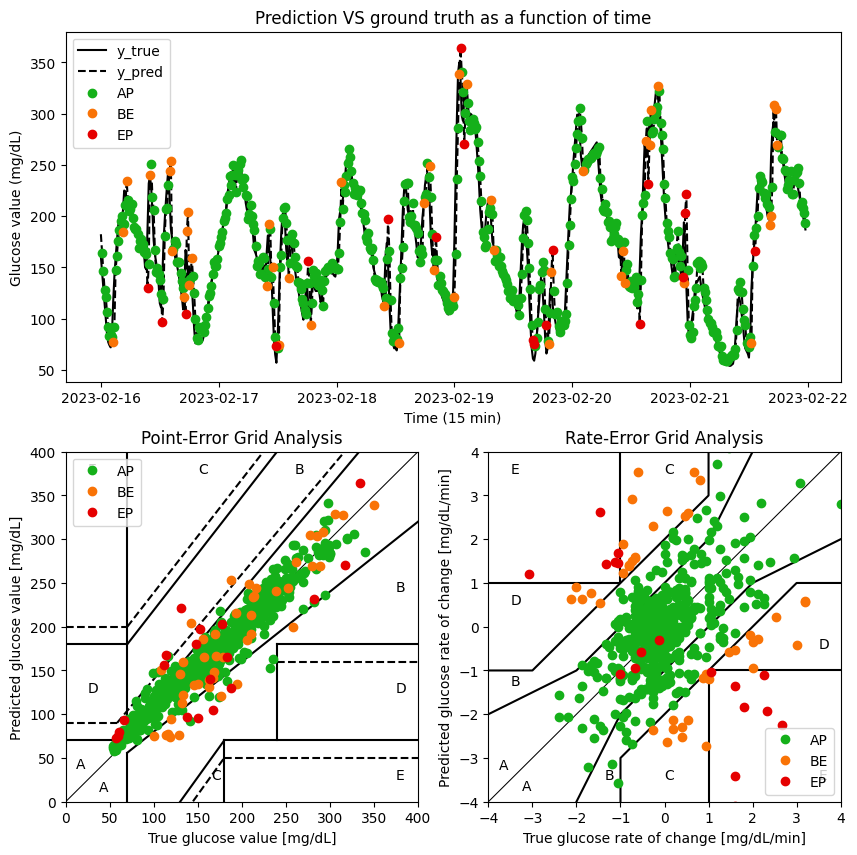

In [105]:
cg_ega = CG_EGA(dfPlot, 15)
print("AP, BE, EP:", cg_ega.reduced())
cg_ega.plot(day=5)

In [106]:
cg_ega.per_sample()

,datetime,y_true,y_pred,dy_true,dy_pred,CG_EGA,P_EGA,R_EGA
0,2023-02-16 00:00:00,160.454545,182.371368,NaN,NaN,NaN,NaN,NaN
1,2023-02-16 00:15:00,145.363636,163.720169,-1.006061,-1.243413,AP,A,A
2,2023-02-16 00:30:00,130.272727,146.308716,-1.006061,-1.160764,AP,A,A
3,2023-02-16 00:45:00,115.181818,128.215302,-1.006061,-1.206228,AP,A,A
4,2023-02-16 01:00:00,100.090909,120.924911,-1.006061,-0.486026,AP,A,A
...,...,...,...,...,...,...,...,...
3581,2023-03-25 07:15:00,188.000000,185.042770,-0.066667,-0.187767,AP,A,A
3582,2023-03-25 07:30:00,182.000000,182.780243,-0.400000,-0.150835,AP,A,A
3583,2023-03-25 07:45:00,171.000000,179.514923,-0.733333,-0.217688,AP,A,A
3584,2023-03-25 08:00:00,167.000000,169.674103,-0.266667,-0.656055,AP,A,A


# Predicción a 60 min del conjunto de pruebas generales

In [107]:
lenHorizonte=2
XTest=[]
YTest=[]
for i in range(lenHorizonte):
    XTest.append(array_Xtest[i]) 
    YTest.append(array_Ytest[i]) 
XTest=np.reshape(XTest, (lenHorizonte, array_Xtest.shape[1],array_Xtest.shape[2]))

df_YTest = pd.DataFrame(YTest, columns=['Glucose level True'])

YTest_scaled=scalerGlucosa.inverse_transform(YTest)
df_YTest_scaled = pd.DataFrame(YTest_scaled, columns=['Glucose level True']) 

In [108]:
yhat = model.predict(XTest)
df_glucose = pd.DataFrame(yhat, columns=['Glucose level Predict'])
df_glucose['Glucose level True']=df_YTest['Glucose level True']
df_glucose.head()

1/1 [==============================] - 0s 24ms/step


,Glucose level Predict,Glucose level True
0,0.309503,0.261858
1,0.268957,0.229051


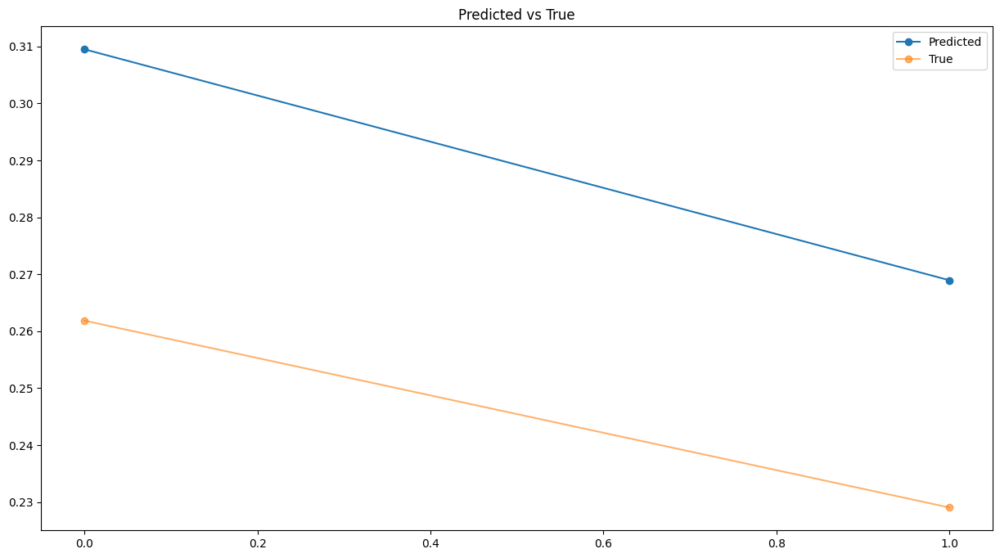

{'mae': 0.043775369091467425,
 'mse': 0.04394609118931282,
 'rmse': 0.001931258930819398}

In [109]:
model_utils.plotPredicted(yhat,YTest)
model_utils.forecast_accuracy(yhat,YTest)

In [110]:
yhat_scaled=scalerGlucosa.inverse_transform(yhat)
df_glucose = pd.DataFrame(yhat_scaled, columns=['Glucose level Predict'])
df_glucose['Glucose level True']=df_YTest_scaled['Glucose level True']
df_glucose.head()

,Glucose level Predict,Glucose level True
0,182.371368,160.454545
1,163.720169,145.363636


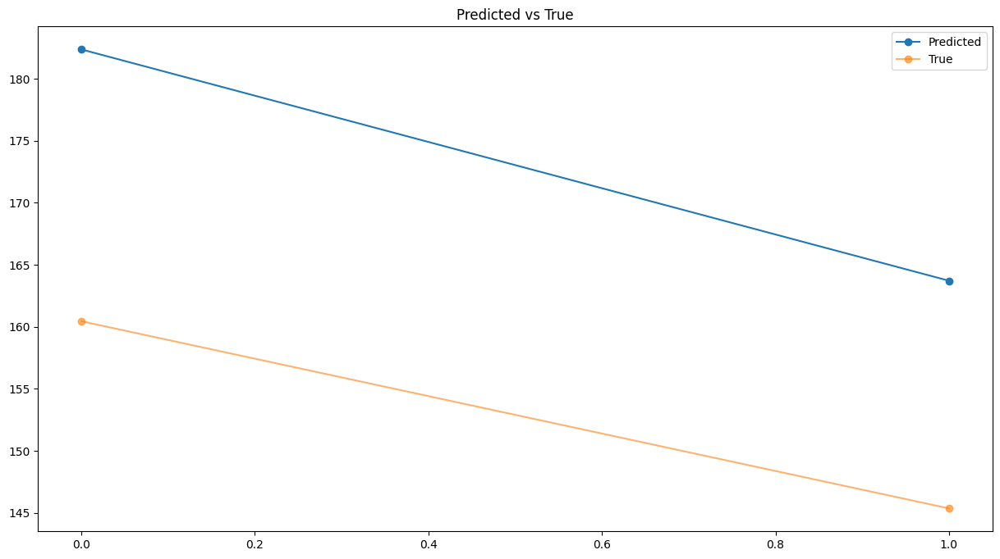

{'mae': 20.136677828702062,
 'mse': 20.215209883719844,
 'rmse': 408.65471064284446}

In [111]:
model_utils.plotPredicted(yhat_scaled,YTest_scaled)
model_utils.forecast_accuracy(yhat_scaled,YTest_scaled)